<a href="https://colab.research.google.com/github/gong-aipel/AIFFEL_quest-cr/blob/main/exploration1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [ ]:
import tensorflow as tf
print(tf.__version__)

2.18.0


In [ ]:
import tensorflow_datasets as tfds

tfds.__version__

'4.9.8'

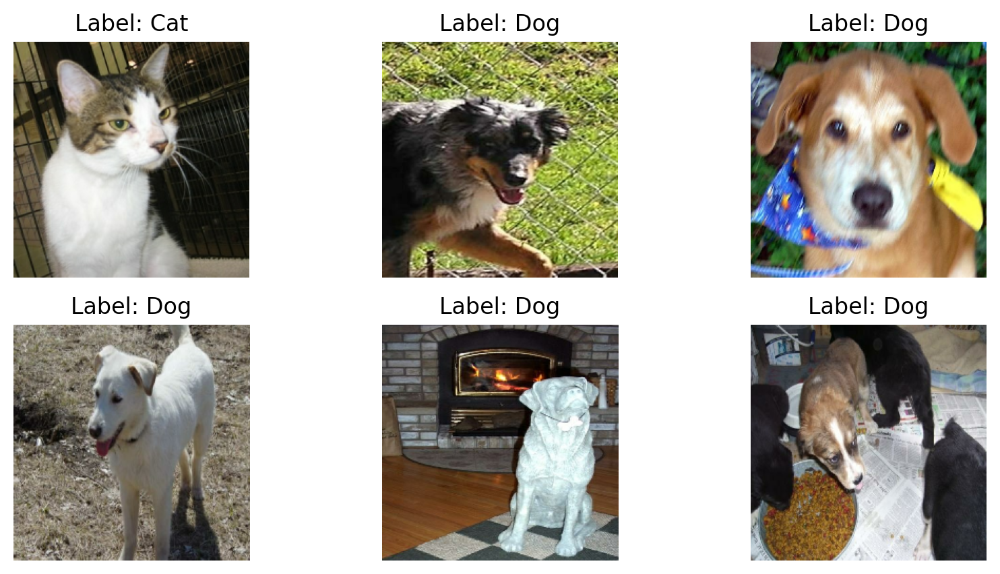

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# ✅ 데이터셋 로드 및 분할
(ds_train, ds_val, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)



# ✅ 이미지 전처리 함수
def format_example(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0  # 정규화
    return image, label

BATCH_SIZE = 32

# ✅ 전처리 적용
train_batches = ds_train.map(format_example).batch(BATCH_SIZE).prefetch(1)
test_batches = ds_test.map(format_example).batch(BATCH_SIZE).prefetch(1)

# ✅ 이미지 샘플 확인
for images, labels in train_batches.take(1):
    plt.figure(figsize=(10, 5))
    for i in range(6):
        plt.subplot(2, 3, i+1)
        plt.imshow(images[i])
        plt.title("Label: {}".format("Dog" if labels[i] else "Cat"))
        plt.axis('off')
    plt.show()


In [ ]:
print(ds_train)
print(ds_val)
print(ds_test)



<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


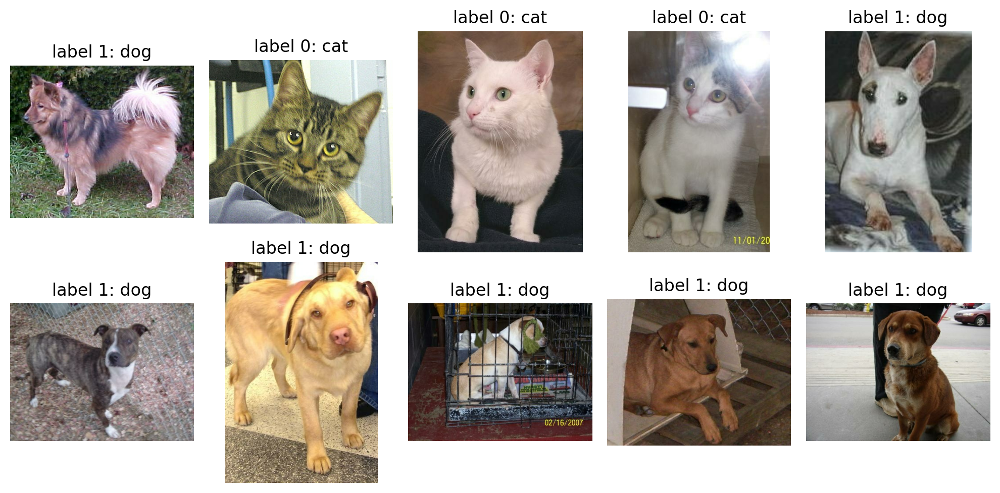

In [ ]:
plt.figure(figsize=(10, 5))

get_label_name = ds_info.features['label'].int2str  # ✅ 여기!

for idx, (image, label) in enumerate(ds_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [ ]:
a = [1.2, 2.5, 3.7, 4.6]
a = list(map(int, a))# 리스트의 요소를 정수로 변환 하여 리스트로 생성
a

[1, 2, 3, 4]

In [ ]:
numbers = list(range(10))  # [0, 1, 2, ..., 9]
string_numbers = list(map(str, numbers))
print(string_numbers)


['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']


In [ ]:
train = ds_train.map(format_example)
validation = ds_val.map(format_example)
test = ds_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


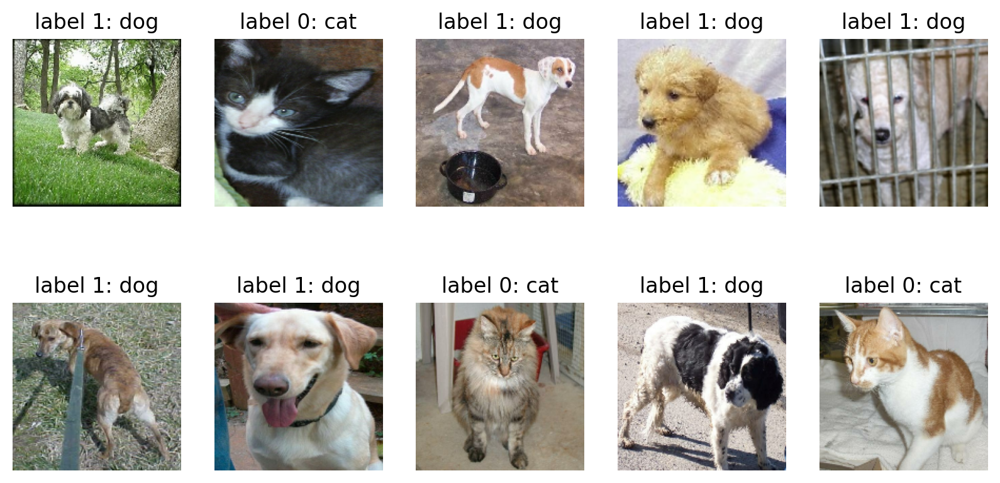

In [ ]:
plt.figure(figsize=(10, 5))

get_label_name = ds_info.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [ ]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

print("슝~")

슝~


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      13,107,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │           1,026 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,132,322 (50.10 MB)

 Trainable params: 13,132,322 (50.10 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [ ]:
image.flatten()

array([1, 2, 3, 4])

In [ ]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [ ]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [ ]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [ ]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 302ms/step - accuracy: 0.4932 - loss: 0.6943
initial loss: 0.70
initial accuracy: 0.46


In [ ]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 661s 1s/step - accuracy: 0.6033 - loss: 0.6655 - val_accuracy: 0.6737 - val_loss: 0.5883
Epoch 2/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 682s 1s/step - accuracy: 0.7288 - loss: 0.5391 - val_accuracy: 0.7489 - val_loss: 0.5166
Epoch 3/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 641s 1s/step - accuracy: 0.7883 - loss: 0.4672 - val_accuracy: 0.7717 - val_loss: 0.4866
Epoch 4/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 634s 1s/step - accuracy: 0.8088 - loss: 0.4222 - val_accuracy: 0.7584 - val_loss: 0.5145
Epoch 5/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 645s 1s/step - accuracy: 0.8355 - loss: 0.3717 - val_accuracy: 0.7812 - val_loss: 0.4786
Epoch 6/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 636s 1s/step - accuracy: 0.8556 - loss: 0.3273 - val_accuracy: 0.7545 - val_loss: 0.5349
Epoch 7/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 656s 1s/step - accuracy: 0.8830 - loss: 0.2800 - val_accuracy: 0.7932 - val_loss: 0.4713
Epoch 8/10
582/582 ━━━━━━━━━━━━━━━━━━━━ 636s 1s/step - accuracy: 0.9064 - loss: 0.2380 - val_accu

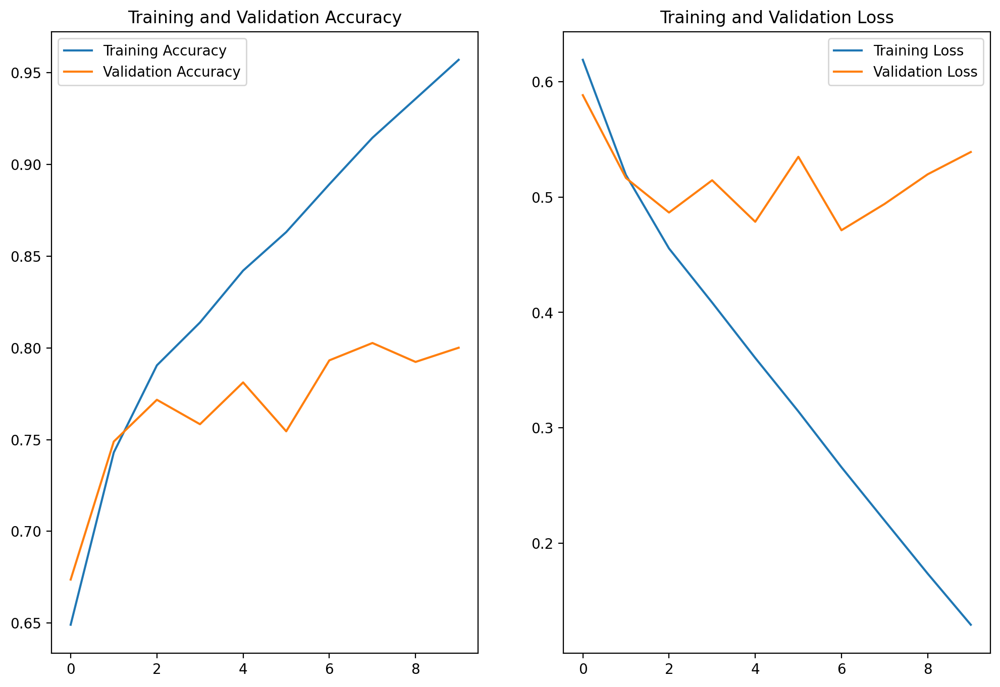

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


array([[9.9869025e-01, 1.3097130e-03],
       [7.7530080e-01, 2.2469924e-01],
       [5.2296426e-02, 9.4770360e-01],
       [9.9923384e-01, 7.6615193e-04],
       [8.0775446e-01, 1.9224545e-01],
       [7.6087505e-01, 2.3912491e-01],
       [3.5595611e-02, 9.6440428e-01],
       [5.7553118e-01, 4.2446885e-01],
       [4.0134434e-02, 9.5986563e-01],
       [8.2052931e-02, 9.1794699e-01],
       [5.3661013e-01, 4.6338975e-01],
       [9.9971867e-01, 2.8138465e-04],
       [9.5671755e-01, 4.3282561e-02],
       [4.1421489e-03, 9.9585789e-01],
       [9.0400809e-01, 9.5991790e-02],
       [9.9869657e-01, 1.3034174e-03],
       [6.3738710e-01, 3.6261290e-01],
       [2.0938160e-05, 9.9997896e-01],
       [5.2907872e-01, 4.7092122e-01],
       [9.5584416e-01, 4.4155791e-02],
       [3.6522385e-01, 6.3477606e-01],
       [9.9524230e-01, 4.7576739e-03],
       [9.9979067e-01, 2.0924347e-04],
       [7.9295176e-01, 2.0704828e-01],
       [9.1064262e-01, 8.9357354e-02],
       [9.5831798e-03, 9.

In [ ]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

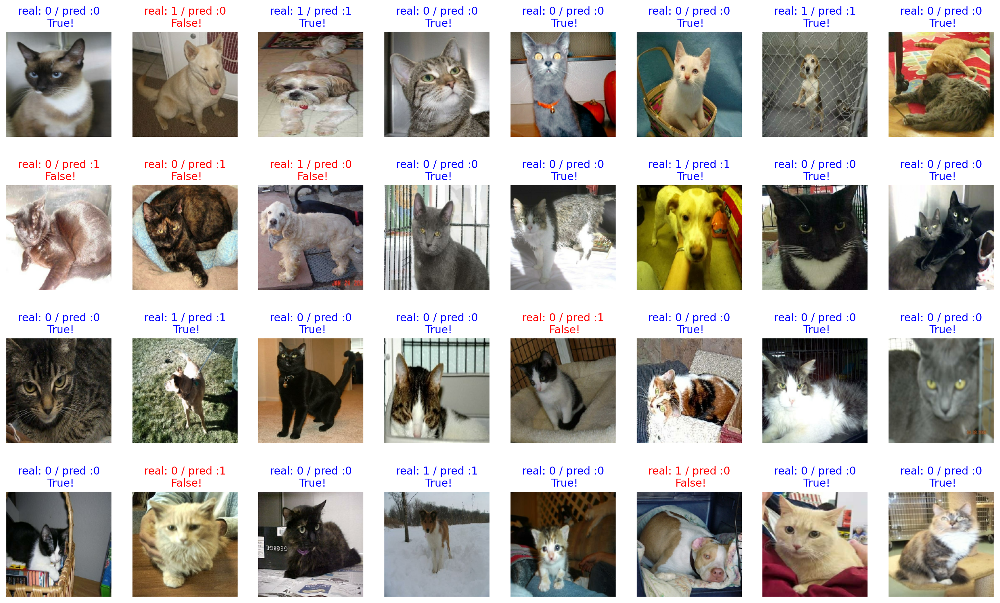

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    if prediction == label:  # ✅ 예측이 정답과 같다면
        count += 1

print(count / 32 * 100)

78.125


In [ ]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [ ]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
base_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 160, 160, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 160, 160, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 80, 80, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 80, 80, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 80, 80, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 40, 40, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 40, 40, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 40, 40, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 40, 40, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 20, 20, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 20, 20, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 20, 20, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 20, 20, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 10, 10, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 10, 10, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 10, 10, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 10, 10, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 5, 5, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [ ]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [ ]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [ ]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
from tensorflow.keras import layers
dense_layer = layers.Dense(units=512, activation='relu') # [[YOUR CODE]]
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer =layers.Dense(units=2, activation='softmax') # [[YOUR CODE]]

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


In [ ]:
base_model.trainable = False
print("슝~")

슝~


In [ ]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 5, 5, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │           1,026 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,978,370 (57.14 MB)

 Trainable params: 263,682 (1.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
base_learning_rate = 0.0001

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
    loss='sparse_categorical_crossentropy',  # 클래스 정답이 정수형(0,1,2...)일 때
    metrics=['accuracy']
)


In [ ]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 197s 10s/step - accuracy: 0.5252 - loss: 0.6873
initial loss: 0.69
initial accuracy: 0.52


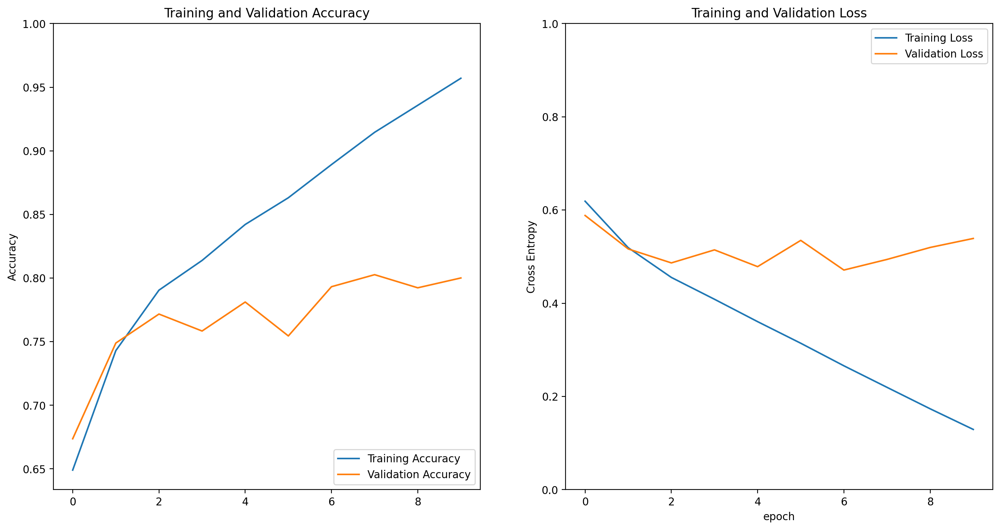

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


array([[0.468699  , 0.53130084],
       [0.343337  , 0.65666294],
       [0.37414482, 0.62585527],
       [0.3914205 , 0.6085796 ],
       [0.45802116, 0.54197884],
       [0.4108706 , 0.58912945],
       [0.39570174, 0.60429835],
       [0.3690933 , 0.63090676],
       [0.35156184, 0.6484383 ],
       [0.35003525, 0.64996475],
       [0.26904604, 0.73095393],
       [0.3964104 , 0.6035896 ],
       [0.37388638, 0.6261135 ],
       [0.35941064, 0.64058936],
       [0.39393526, 0.6060647 ],
       [0.35754943, 0.6424505 ],
       [0.38568863, 0.61431134],
       [0.27987286, 0.7201271 ],
       [0.36982763, 0.6301724 ],
       [0.36215186, 0.637848  ],
       [0.34622034, 0.6537797 ],
       [0.39491656, 0.6050834 ],
       [0.49140263, 0.5085973 ],
       [0.3232846 , 0.67671543],
       [0.4804455 , 0.51955444],
       [0.32982144, 0.67017853],
       [0.33093968, 0.6690603 ],
       [0.35245672, 0.64754325],
       [0.36974636, 0.6302537 ],
       [0.3658268 , 0.6341733 ],
       [0.

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

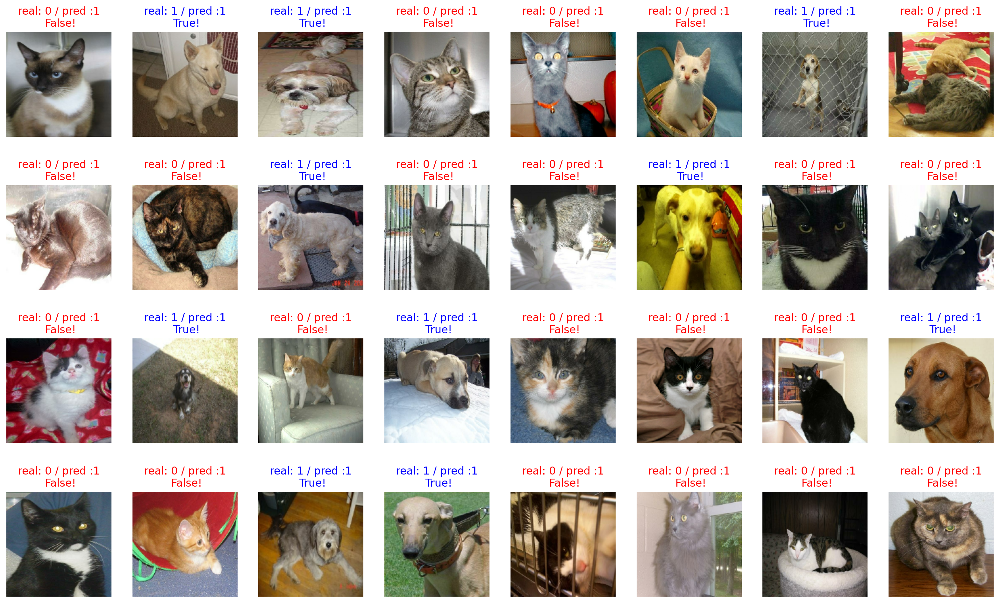

In [ ]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

31.25


In [ ]:
!mkdir -p ~/aiffel/cat_vs_dog/checkpoint
!mkdir -p ~/aiffel/cat_vs_dog/images

In [ ]:
!mkdir -p /content/drive/MyDrive/cat_vs_dog/models
!mkdir -p /content/drive/MyDrive/cat_vs_dog/images


In [ ]:
checkpoint_path = '/content/drive/MyDrive/cat_vs_dog/models/best_model.keras'

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=False,  # 전체 모델 저장
    save_best_only=True,
    monitor='val_loss',
    verbose=1
)


In [ ]:
checkpoint_path = '/content/drive/MyDrive/cat_vs_dog/models/best_model.h5'


In [ ]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=False,  # 전체 모델 저장
    save_best_only=True,
    monitor='val_loss',
    verbose=1
)


In [ ]:
(ds_train, ds_val, ds_test), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True
)

def format_example(image, label):
    image = tf.image.resize(image, (160, 160))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_dataset = ds_train.map(format_example).batch(32).prefetch(1)
validation_dataset = ds_val.map(format_example).batch(32).prefetch(1)


In [ ]:
import os
print(os.path.exists('/content/drive/MyDrive/cat_vs_dog/models/best_model.h5'))


False


In [ ]:
for image, label in train_dataset.take(1):
    print(image.shape, label)


(32, 160, 160, 3) tf.Tensor([1 1 1 0 1 0 1 0 0 0 1 1 0 0 1 0 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0], shape=(32,), dtype=int64)


In [ ]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/cat_vs_dog/models/temp_model.h5',
    save_best_only=False,
    save_weights_only=False,
    verbose=1
)

model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=1,
    callbacks=[checkpoint_cb]
)


582/582 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.8389 - loss: 0.4178 
Epoch 1: saving model to /content/drive/MyDrive/cat_vs_dog/models/temp_model.h5


582/582 ━━━━━━━━━━━━━━━━━━━━ 6628s 11s/step - accuracy: 0.8389 - loss: 0.4177 - val_accuracy: 0.8813 - val_loss: 0.2831


In [ ]:
!ln -s ~/data/* ~/aiffel/cat_vs_dog/images/

ln: failed to create symbolic link '/root/aiffel/cat_vs_dog/images/': No such file or directory


In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

# ✅ 1. 데이터 로드 및 분할 (80:10:10)
(raw_train, raw_val, raw_test), ds_info = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    as_supervised=True,  # (image, label) 튜플로 불러옴
    with_info=True
)

# ✅ 2. 이미지 전처리 함수 정의 (예: 160x160으로 resize, 정규화)
IMG_SIZE = 160

def format_example(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32) / 255.0  # 정규화
    return image, label

# ✅ 3. 배치 크기 설정
BATCH_SIZE = 32

# ✅ 4. 데이터셋 전처리 및 배치 적용
train_batches = raw_train.map(format_example).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
validation_batches = raw_val.map(format_example).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_batches = raw_test.map(format_example).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/tf_flowers/incomplete.NT7HCC_3.0.1/tf_flowers-train.tfrecord*...:   0%|   …

Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# 데이터 로드
(raw_train, raw_val, raw_test), ds_info = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    as_supervised=True,
    with_info=True
)

IMG_SIZE = 160
BATCH_SIZE = 32

# 이미지 전처리 함수
def format_example(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

# 배치 구성
train_batches = raw_train.map(format_example).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
validation_batches = raw_val.map(format_example).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_batches = raw_test.map(format_example).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [3]:
base_model = tf.keras.applications.VGG16(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # 전이학습: base는 freeze

# 분류기 설계
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.3),  # 정규화 기법 적용
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')  # 클래스 수 5개!
])


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [4]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS = 10
history = model.fit(
    train_batches,
    validation_data=validation_batches,
    epochs=EPOCHS
)


Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1040s 11s/step - accuracy: 0.2222 - loss: 1.6572 - val_accuracy: 0.4114 - val_loss: 1.4222
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1067s 12s/step - accuracy: 0.4568 - loss: 1.4277 - val_accuracy: 0.5668 - val_loss: 1.2515
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1055s 11s/step - accuracy: 0.5604 - loss: 1.2726 - val_accuracy: 0.6131 - val_loss: 1.1213
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1054s 11s/step - accuracy: 0.6201 - loss: 1.1548 - val_accuracy: 0.6757 - val_loss: 1.0279
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1102s 11s/step - accuracy: 0.6624 - loss: 1.0618 - val_accuracy: 0.6812 - val_loss: 0.9479
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1052s 11s/step - accuracy: 0.6481 - loss: 1.0087 - val_accuracy: 0.7057 - val_loss: 0.8972
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1105s 11s/step - accuracy: 0.6719 - loss: 0.9490 - val_accuracy: 0.6975 - val_loss: 0.8559
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 1103s 12s/step - accuracy: 0.6906 - loss: 0.8991 - val_accu

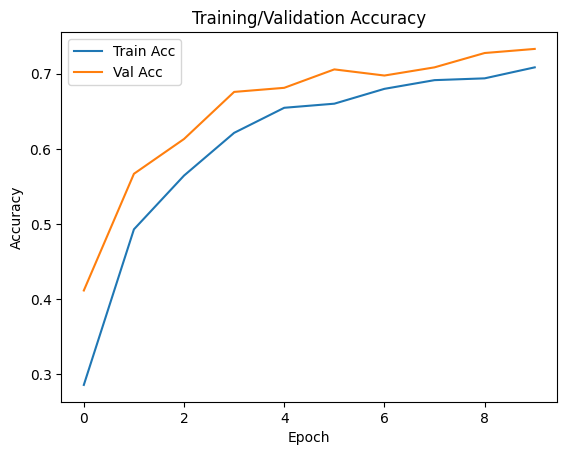

12/12 ━━━━━━━━━━━━━━━━━━━━ 113s 9s/step - accuracy: 0.7169 - loss: 0.8037
✅ Test Accuracy: 0.7221


In [5]:
# 학습 시각화
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training/Validation Accuracy')
plt.show()

# 테스트셋 평가
test_loss, test_acc = model.evaluate(test_batches)
print(f"✅ Test Accuracy: {test_acc:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


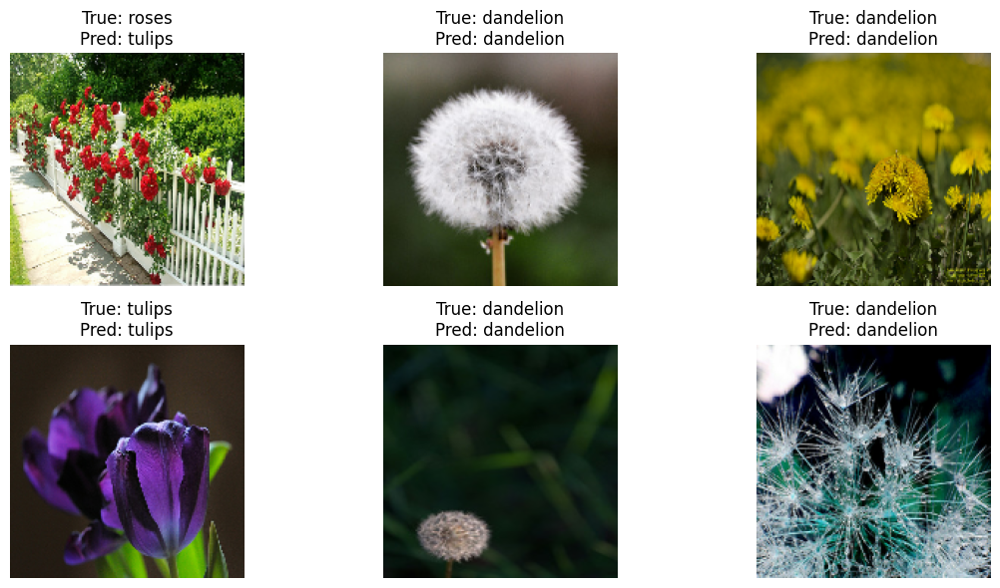

In [6]:
class_names = ds_info.features['label'].names

# 예측 샘플 시각화
for images, labels in test_batches.take(1):
    predictions = model.predict(images)
    plt.figure(figsize=(12, 6))
    for i in range(6):
        plt.subplot(2, 3, i+1)
        plt.imshow(images[i])
        pred_label = tf.argmax(predictions[i]).numpy()
        true_label = labels[i].numpy()
        plt.title(f'True: {class_names[true_label]}\nPred: {class_names[pred_label]}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


In [7]:
base_model.trainable = True  # 전체를 푼다음...

# 일부만 fine-tune: 마지막 4개 블록만 학습
for layer in base_model.layers[:-4]:
    layer.trainable = False


In [8]:
from tensorflow.keras import layers, models

model = tf.keras.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(5, activation='softmax')
])


In [9]:
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=(160, 160, 3),
    include_top=False,
    weights='imagenet'
)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [10]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.00005)


In [11]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2)
])

# 모델 앞에 끼워넣기
model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),
    layers.Dense(256, activation='relu'),
    layers.Dense(5, activation='softmax')
])


In [14]:
IMG_SIZE = 224  # EfficientNet은 최소 224로 기대함

def format_example(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label


In [15]:
train_batches = raw_train.map(format_example).shuffle(1000).batch(32).prefetch(tf.data.AUTOTUNE)
validation_batches = raw_val.map(format_example).batch(32).prefetch(tf.data.AUTOTUNE)
test_batches = raw_test.map(format_example).batch(32).prefetch(tf.data.AUTOTUNE)


회고

tf_flowers 이미지 분류 프로젝트 요약
사용 데이터: TensorFlow Datasets의 tf_flowers (5개 클래스)

모델 구조: VGG16 (ImageNet 사전 학습, feature extractor로 사용)

GlobalAveragePooling2D → Dropout(0.3) → Dense(256, ReLU) → Dense(5, Softmax)

전처리: 이미지 크기 (160, 160), 정규화, 배치 구성

성능:

Validation Accuracy 최고 약 71.33%

Test Accuracy 약 72.2%

시도한 것들:

EfficientNet + Fine-Tuning: 성능 하락 (약 40%)

Dropout, BatchNorm, Data Augmentation 등 실험

회고:

복잡한 모델이 항상 더 좋은 결과를 주진 않음

모델보다 전처리와 데이터에 따라 결과가 크게 좌우될 수 있음

실험을 통해 안정적인 기준 모델을 찾는 과정이 중요하다는 걸 배움

